In [42]:
import os
import conda

conda_file_dir = conda.__file__
conda_dir = conda_file_dir.split('lib')[0]
proj_lib = os.path.join(os.path.join(conda_dir, 'share'), 'proj')
os.environ["PROJ_LIB"] = proj_lib

from mpl_toolkits.basemap import Basemap

In [43]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from matplotlib import animation,rc
import base64
import io
from IPython.display import HTML, display
from scipy.misc import imread
import codecs
%matplotlib inline

import plotly.offline as py
import plotly.graph_objs as go
from plotly import tools
py.offline.init_notebook_mode()


In [44]:
import zipfile

fantasy_zip = zipfile.ZipFile('gtd.zip')
fantasy_zip.extractall()

fantasy_zip.close()

# Load, check data

In [45]:
df = pd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')
df.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','region_txt':'Region',
                       'attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded',
                       'summary':'Summary','gname':'Group','targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type',
                       'motive':'Motive'},inplace=True)
df=df[['Year','Month','Day','Country','Region','city','latitude','longitude','AttackType','Killed','Wounded','Target','Summary','Group','Target_type','Weapon_type','Motive']]
df['Weapon_type'] = df['Weapon_type'].apply(lambda x: x.replace(' (not to include vehicle-borne explosives, i.e., car or truck bombs)', ''))
df.head()

,Year,Month,Day,Country,Region,city,latitude,longitude,AttackType,Killed,Wounded,Target,Summary,Group,Target_type,Weapon_type,Motive
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN


## Some basic statistic

In [46]:
df.isna().sum()

Year                0
Month               0
Day                 0
Country             0
Region              0
city              434
latitude         4556
longitude        4557
AttackType          0
Killed          10313
Wounded         16311
Target            636
Summary         66129
Group               0
Target_type         0
Weapon_type         0
Motive         131130
dtype: int64

In [47]:
df.shape

(181691, 17)

In [48]:
df.describe()

,Year,Month,Day,latitude,longitude,Killed,Wounded
count,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,171378.000000,165380.000000
mean,2002.638997,6.467277,15.505644,23.498343,-4.586957e+02,2.403272,3.167668
std,13.259430,3.388303,8.814045,18.569242,2.047790e+05,11.545741,35.949392
min,1970.000000,0.000000,0.000000,-53.154613,-8.618590e+07,0.000000,0.000000
25%,1991.000000,4.000000,8.000000,11.510046,4.545640e+00,0.000000,0.000000
50%,2009.000000,6.000000,15.000000,31.467463,4.324651e+01,0.000000,0.000000
75%,2014.000000,9.000000,23.000000,34.685087,6.871033e+01,2.000000,2.000000
max,2017.000000,12.000000,31.000000,74.633553,1.793667e+02,1570.000000,8191.000000


In [49]:
df.select_dtypes(include=['object']).describe()

,Country,Region,city,AttackType,Target,Summary,Group,Target_type,Weapon_type,Motive
count,181691,181691,181257,181691,181055,115562,181691,181691,181691,50561
unique,205,12,36674,9,86006,112492,3537,22,12,14490
top,Iraq,Middle East & North Africa,Unknown,Bombing/Explosion,Civilians,"09/00/2016: Sometime between September 18, 201...",Unknown,Private Citizens & Property,Explosives,Unknown
freq,24636,50474,9775,88255,6461,100,82782,43511,92426,14889


In [50]:
# Страны с самым высоким уровнем терористической аттаки
df['Country'].value_counts().head(10)

Iraq              24636
Pakistan          14368
Afghanistan       12731
India             11960
Colombia           8306
Philippines        6908
Peru               6096
El Salvador        5320
United Kingdom     5235
Turkey             4292
Name: Country, dtype: int64

In [51]:
# Регион с самым высоким уровнем терористической аттаки
df['Region'].value_counts()

Middle East & North Africa     50474
South Asia                     44974
South America                  18978
Sub-Saharan Africa             17550
Western Europe                 16639
Southeast Asia                 12485
Central America & Caribbean    10344
Eastern Europe                  5144
North America                   3456
East Asia                        802
Central Asia                     563
Australasia & Oceania            282
Name: Region, dtype: int64

In [52]:
# Тип оружия который применялся
df['Weapon_type'].value_counts()

Explosives            92426
Firearms              58524
Unknown               15157
Incendiary            11135
Melee                  3655
Chemical                321
Sabotage Equipment      141
Vehicle                 136
Other                   114
Biological               35
Fake Weapons             33
Radiological             14
Name: Weapon_type, dtype: int64

# Базовые диаграммы, которые будут использоватся в дашбордах

In [53]:
year = df['Year'].value_counts().reset_index().sort_values('index')
year.rename(columns = {'Year':'count','index':'year'}, inplace = True)
year

trace = go.Bar(x=year['year'], y= year['count'].values,# mode = 'line', 
                   marker = dict(color = year['count']))

layout = dict(xaxis=dict(tickangle = 270, autotick = False), 
              annotations = [dict(text = 'Год: {}<br>Количество нападений: {}'.format(year.loc[year['count']==year['count'].max(),'year'][0], year['count'].max()), 
                                  x= year.loc[year['count']==year['count'].max(),'year'][0],y=year['count'].max(),ax=-120,ay=20,
                                 align = 'left', arrowhead=2, arrowsize=1, arrowwidth=2, arrowcolor='red', bordercolor='red', borderwidth=2,
                                 bgcolor='black', font = dict(color = 'white'))],
             title = 'Динамика террористических актов за исследуемый период')


fig = go.Figure(data = [trace], layout = layout)

py.iplot(fig)

In [54]:
def bar_plot(feature, title, x_title, y_title):
    grouped = df[feature].value_counts().reset_index()
    
    trace = go.Bar(x=grouped['index'], y= grouped[feature], marker = dict(color = grouped[feature], colorscale = 'Hot'))
    layout = go.Layout(dict(xaxis = dict(tickangle = 270, title = x_title, showticklabels=True, showaxeslabels=True, color = 'white'), 
                           title = title, font = dict(size=16, color = 'white'),
                           yaxis = dict(title=y_title, color = 'white')),
                      margin=go.Margin(r=50, b = 250),
                      paper_bgcolor= 'black', plot_bgcolor = 'grey') 
    
    fig = go.Figure(data = [trace], layout = layout) 
    return py.iplot(fig)
    
    
bar_plot('Weapon_type', 'Какое оружие используют террористы', "Виды оружия", "Количество")

In [55]:

bar_plot('Target_type', "Что атакуют террористы", "Цели терротистов", "Количество")

In [56]:
bar_plot('Region', "Количество терроростических актов по регионам", "Регионы", "Количество")

In [57]:
gr2 = df.groupby(['Year','Region'], as_index = False)['city'].agg({'count':'count'})

full_trace = []
for i in gr2['Region'].unique():
    ggg = gr2[gr2['Region']==i]
    trace = go.Scatter(dict(x = ggg['Year'], 
                            y= ggg['count'].values, 
                            name = i, 
                            mode = 'lines+markers'))
    full_trace.append(trace)

layout = go.Layout(legend = dict(x=0.01, y= 0.98, bgcolor = 'lightgrey', bordercolor = 'white', borderwidth=2),
                  plot_bgcolor = 'black', paper_bgcolor = 'lightgrey', font = dict(color = 'black'),
                  title = 'Динамика террористических актов по Регионам',
                  xaxis = dict(autotick = False, tickangle = 270, dtick = 2))
fig = go.Figure(data = full_trace, layout = layout)

py.iplot(fig)

In [58]:
gr3 = df.groupby(['AttackType','Region'], as_index = False)['city'].agg({'count':'count'})

all_traces = []
for i in gr3['AttackType'].unique():
    trace = go.Bar(y = gr3['Region'], x = gr3[gr3['AttackType']==i]['count'].values, orientation = 'h',
                  name = i)
    
    all_traces.append(trace)

layout = go.Layout(barmode='stack',yaxis = dict(title = 'Регион'), legend = dict(orientation = 'h'),
                  margin=go.Margin(l=250), font = dict(color = 'white'),
                  paper_bgcolor = 'black', title = 'Типы терротистических атак в зависимости от региона.')

fig = go.Figure(data = all_traces, layout=layout)

py.iplot(fig)

In [59]:
pivot = df.pivot_table(index = 'Region', values = ['Killed','Wounded'], aggfunc=sum).reset_index()
pivot['sum'] = pivot['Killed']+pivot['Wounded'] 
pivot['perc'] = pivot['sum'].div(pivot['sum'].sum())
pivot['perc'] = round((pivot['perc']*100),2)

pivot

,Region,Killed,Wounded,sum,perc
0,Australasia & Oceania,150.0,260.0,410.0,0.04
1,Central America & Caribbean,28708.0,8991.0,37699.0,4.03
2,Central Asia,1000.0,2009.0,3009.0,0.32
3,East Asia,1152.0,9213.0,10365.0,1.11
4,Eastern Europe,7415.0,12045.0,19460.0,2.08
5,Middle East & North Africa,137642.0,214308.0,351950.0,37.61
6,North America,4916.0,21531.0,26447.0,2.83
7,South America,28849.0,16704.0,45553.0,4.87
8,South Asia,101319.0,141360.0,242679.0,25.93
9,Southeast Asia,15637.0,26259.0,41896.0,4.48


In [60]:
# размер кругов

def get_size(x):
    if x <=1: return 2
    elif (x >1) & (x<=2.5): return 4
    elif (x >2.5) & (x <=5): return 6
    elif (x >5) & (x<=10): return 8
    elif (x >10) & (x<=26): return 12
    else: return 16

pivot_size = pivot['perc'].apply(lambda x:  get_size(int(x)))
pivot['size'] =pivot['perc'].apply(lambda x:  get_size(int(x)))

colors = ['#e6194b', '#f58231', '#ffe119', '#bfef45', '#3cb44b', '#42d4f4', '#4363d8', '#911eb4', '#f032e6', '#e6beff', '#a9a9a9','blue']
pivot['colors'] = colors

In [61]:
# текст при наведении

full_text = []
for i in range(len(pivot)):
    text = pivot.loc[i,'Region']+' ({}%)<br>Убитых: {}<br>Раненных: {}'.format(pivot.loc[i,'perc'].astype(str),
                                                                             pivot.loc[i,'Killed'].astype(int).round(),
                                                                             pivot.loc[i,'Wounded'].astype(int).round())
    full_text.append(text)
pivot['text'] = full_text

In [62]:
# target_xaxis = np.log(pivot['Wounded'])
# target_yaxis = np.log(pivot['Killed'])
# region = pivot['Region']

# annotations = []
# for i in range(len(region)):
#     annotations.append(dict(x=target_xaxis[i], y=target_yaxis[i],
#                             xanchor='middle', yanchor='top',
#                             text=region[i], showarrow=False))

In [63]:
trace = go.Scatter(x=pivot['Wounded'], y= pivot['Killed'], mode = 'markers', text = full_text, 
                   hoverinfo = 'text', 
                   marker = dict(size = pivot_size.values*5,opacity = 0.7, color = 'rgb(240, 140, 45)'))

layout = go.Layout(title = 'Соотношение убитых к раненным по регионам',
                  xaxis = dict(type = 'log', title = 'Раненных'),
                  yaxis = dict(type = 'log', title = 'Убитых'))

#layout['annotations'] = annotations

fig = go.Figure(data = [trace], layout = layout)
py.iplot(fig)

In [64]:
full_bubble = []
for i in pivot['Region'].unique():
    reg = pivot[pivot['Region']==i]
    trace = go.Scatter(x=reg['Wounded'], y= reg['Killed'], mode = 'markers', text = reg['text'], textposition = 'bottom center',
                   name = i, hoverinfo = 'text',
                   marker = dict(size = reg['size']*5, opacity = 0.7, color = reg['colors']))
    full_bubble.append(trace)
    
layout = go.Layout(title = 'Соотношение убитых к раненным по регионам',
                  xaxis = dict( title = 'Раненных'),
                  yaxis = dict(range = pivot['Killed'], title = 'Убитых'),
                  hovermode = 'closest')


fig = go.Figure(data = full_bubble, layout = layout)
py.iplot(fig)

### Killed vs Wounded by city

In [65]:
pivot = df.pivot_table(index = 'city', values = ['Killed','Wounded'], aggfunc=sum).reset_index()
pivot['sum'] = pivot['Killed']+pivot['Wounded'] 
pivot.sort_values('sum', ascending=False, inplace = True)
pivot = pivot.head(11)
pivot.drop(pivot.index[1], inplace = True)
pivot

,city,Killed,Wounded,sum
3042,Baghdad,21151.0,56725.0,77876.0
24144,New York City,2838.0,16781.0,19619.0
22828,Mosul,7140.0,5787.0,12927.0
16058,Karachi,3688.0,5688.0,9376.0
22519,Mogadishu,3913.0,4955.0,8868.0
15377,Kabul,2493.0,5973.0,8466.0
4417,Beirut,1916.0,5341.0,7257.0
17457,Kirkuk,1628.0,5008.0,6636.0
8037,Colombo,1386.0,4520.0,5906.0
1374,Aleppo,2125.0,3623.0,5748.0


In [66]:
trace1= go.Bar(x=pivot['city'], y = pivot.Killed, name = 'Убитые')
trace2= go.Bar(x=pivot['city'], y = pivot.Wounded, name = 'Раненные')

layout=go.Layout(title = 'Самые неблагоприятные города для жизни')
fig = go.Figure(data = [trace1,trace2], layout=layout)
py.iplot(fig)

In [67]:
df.columns

Index(['Year', 'Month', 'Day', 'Country', 'Region', 'city', 'latitude',
       'longitude', 'AttackType', 'Killed', 'Wounded', 'Target', 'Summary',
       'Group', 'Target_type', 'Weapon_type', 'Motive'],
      dtype='object')

In [68]:
pivot = df.pivot_table(index = ['Region', 'Year'], values = ['Killed','Wounded'], aggfunc=sum).reset_index()

def sub_plot(type, title):
    full_trace = []
    for i in pivot['Region'].unique():
        ggg = pivot[pivot['Region']==i]
        trace = go.Scatter(dict(x = ggg['Year'], 
                                y= ggg[type].values, 
                                name = i, 
                                mode = 'lines+markers'))
        full_trace.append(trace)
        
    layout = go.Layout(legend = dict(x=0.01, y= 0.98, bgcolor = 'lightgrey', bordercolor = 'white', borderwidth=2),
                  plot_bgcolor = 'black', paper_bgcolor = 'lightgrey', font = dict(color = 'black'),
                  title = title,
                  xaxis = dict(autotick = False, tickangle = 270, dtick = 2))
    fig = go.Figure(data = full_trace, layout = layout)
    return fig

fig1 = sub_plot('Killed', 'Динамика убитых по регионам')
fig2 = sub_plot('Wounded', 'Динамика раненых по регионам')

py.iplot(fig1)
py.iplot(fig2)

## insert chart

In [69]:
pivot = df.pivot_table(index = ['Month', 'Year'], values = ['Killed','Wounded'], aggfunc=sum).reset_index()
pivot = pivot[pivot['Month'] != 0]
pivot.replace({1:'Январь',2:'Февраль',3:'Март',4:'Апрель',5:'Май',6:'Июнь',7:'Июль',8:'Август',
              9:'Сентябрь',10:'Октябрь',11:'Ноябрь',12:'Декабрь'}, inplace = True)
pivot['Month'].unique()

array(['Январь', 'Февраль', 'Март', 'Апрель', 'Май', 'Июнь', 'Июль',
       'Август', 'Сентябрь', 'Октябрь', 'Ноябрь', 'Декабрь'], dtype=object)

In [70]:
full_trace = []
for i in pivot['Month'].unique():
    ggg = pivot[pivot['Month']==i]
    trace = go.Scatter(dict(x = ggg['Year'], 
                            y= ggg['Killed'].values, 
                            name = i, 
                            mode = 'lines+markers'))
    full_trace.append(trace)
    
# inner plot
inner_trace = []
for i in pivot['Month'].unique():
    ggg = pivot[pivot['Month']==i]
    trace = go.Scatter(dict(x = ggg['Year'], 
                            y= ggg['Wounded'].values, 
                            name = i, 
                            mode = 'lines+markers',
                            xaxis='x2',yaxis='y2', showlegend = False))
    inner_trace.append(trace)
    
        
layout = go.Layout(legend = dict(bgcolor = 'lightgrey', bordercolor = 'white', borderwidth=2,
                                orientation = 'h'),
                  margin = go.Margin(t = 50),
                  plot_bgcolor = 'black', paper_bgcolor = 'lightgrey', font = dict(color = 'black'),
                  title = 'Помесячная динамика по Убийствам',
                  xaxis = dict(autotick = False, tickangle = 270, dtick = 2,showgrid = False),
                  yaxis = dict(showgrid = False),
                  xaxis2=dict(domain=[0, 0.55],anchor='y2', title = 'Помесячная динамика по Раненным', color = 'white',
                             showline = False, showgrid = False),
                  yaxis2=dict(domain=[0.5, 1],anchor='x2',autotick = False),
                  height = 700, width = 1000)
fig = go.Figure(data = full_trace+ inner_trace, layout = layout)

py.iplot(fig)

In [71]:
map = df[df['Year']==2011].pivot_table(index = ['city', 'latitude','longitude'], values =['Killed','Wounded'], aggfunc=sum).reset_index()
map['injury'] = (map['Killed']+map['Wounded']).astype(int)

text_full=[]
for i in range(len(map)):
    text = '{}<br>Killed: {}<br>Wounded:{}'.format(map.loc[i,'city'],
                                                   map.loc[i,'Killed'].astype(int).round(),
                                                   map.loc[i,'Wounded'].astype(int).round())
    text_full.append(text)
map['text'] = text_full
map = map[map['injury']!=0]
map.head()

,city,latitude,longitude,Killed,Wounded,injury,text
3,Abbarah,33.813793,44.657238,1.0,5.0,6,Abbarah<br>Killed: 1<br>Wounded:5
4,Abepura,-2.662539,140.699787,8.0,7.0,15,Abepura<br>Killed: 8<br>Wounded:7
5,Abhoynagar,23.844348,91.286363,0.0,2.0,2,Abhoynagar<br>Killed: 0<br>Wounded:2
6,Abobo,5.419303,-4.021559,6.0,0.0,6,Abobo<br>Killed: 6<br>Wounded:0
7,Abu Ghraib,33.310650,44.038208,55.0,69.0,124,Abu Ghraib<br>Killed: 55<br>Wounded:69


In [72]:
#map['injury'].value_counts().reset_index().sort_values('index')

def get_size(x):
    if x <=10: return 6
    elif (x >11) & (x <=25): return 8
    elif (x >26) & (x<=50): return 10
    elif (x >51) & (x<=100): return 12
    elif (x >101) & (x<=250): return 14
    elif (x >251) & (x<=500): return 16
    else: return 18
    
map['size'] = map['injury'].apply(lambda x: get_size(x))
map.head()

,city,latitude,longitude,Killed,Wounded,injury,text,size
3,Abbarah,33.813793,44.657238,1.0,5.0,6,Abbarah<br>Killed: 1<br>Wounded:5,6
4,Abepura,-2.662539,140.699787,8.0,7.0,15,Abepura<br>Killed: 8<br>Wounded:7,8
5,Abhoynagar,23.844348,91.286363,0.0,2.0,2,Abhoynagar<br>Killed: 0<br>Wounded:2,6
6,Abobo,5.419303,-4.021559,6.0,0.0,6,Abobo<br>Killed: 6<br>Wounded:0,6
7,Abu Ghraib,33.310650,44.038208,55.0,69.0,124,Abu Ghraib<br>Killed: 55<br>Wounded:69,14


In [73]:
mapbox_access_token = 'pk.eyJ1IjoiYW15YXJkIiwiYSI6ImNqbm02dzVtMjA1dDYzdnF4MW81cTR5Y3EifQ.HaYUoMAJtBABe18u0mBn5w'

In [74]:
fatality = dict(
           type = 'scattergeo',
           locationmode = 'world',
           showlegend = False,
           lon = map['longitude'],
           lat = map['latitude'],
           text = map['text'],
           mode = 'markers',
           hoverinfo = 'text+name',
           marker = dict(
               size = map['size'],
               opacity = 0.95,
               color = 'rgb(240, 140, 45)')
           )
        

layout = dict(
         title = 'Terrorist Attacks by Latitude/Longitude 2011',
         showlegend = True,
         legend = dict(
             x = 0.85, y = 0.4
         ),
         geo = dict(
             scope = 'world',
             showland = True,
             landcolor = 'rgb(250, 250, 250)',
             subunitwidth = 1,
             subunitcolor = 'rgb(217, 217, 217)',
             countrywidth = 1,
             countrycolor = 'rgb(217, 217, 217)',
             showlakes = True,
             lakecolor = 'rgb(255, 255, 255)')
         )

data = [fatality]
figure = dict(data = data, layout = layout)
py.iplot(figure)

# West Europa

In [75]:
def map_data(map):
    map['injury'] = (map['Killed']+map['Wounded']).astype(int)

    text_full=[]
    for i in range(len(map)):
        text = '{}<br>Killed: {}<br>Wounded:{}'.format(map.loc[i,'city'],
                                                       map.loc[i,'Killed'].astype(int).round(),
                                                       map.loc[i,'Wounded'].astype(int).round())
        text_full.append(text)
    map['text'] = text_full
    
    map = map[map['injury']!=0]
    
    def get_size(x):
        if x <=10: return 2*1.5
        elif (x >11) & (x <=25): return 3*1.5
        elif (x >26) & (x<=50): return 4*1.5
        elif (x >51) & (x<=100): return 8
        elif (x >101) & (x<=250): return 10
        elif (x >251) & (x<=500): return 12
        else: return 14
    
    map['size'] = map['injury'].apply(lambda x: get_size(x))
    return map

In [76]:
we = df[df['Region'] == 'Western Europe'].pivot_table(index = ['city', 'latitude','longitude'], values =['Killed','Wounded'], aggfunc=sum).reset_index()

we = map_data(we)
we.head()

,city,latitude,longitude,Killed,Wounded,injury,text,size
0,A Coruna district,43.370873,-8.395835,3.0,3.0,6,A Coruna district<br>Killed: 3<br>Wounded:3,3.0
1,Aachen,50.775439,6.081510,1.0,1.0,2,Aachen<br>Killed: 1<br>Wounded:1,3.0
3,Aalst,50.934100,4.045130,7.0,3.0,10,Aalst<br>Killed: 7<br>Wounded:3,3.0
7,Abbotsinch,55.863239,-4.427852,1.0,2.0,3,Abbotsinch<br>Killed: 1<br>Wounded:2,3.0
10,Aberra,41.518061,1.902806,0.0,1.0,1,Aberra<br>Killed: 0<br>Wounded:1,3.0


In [77]:
fatality = dict(
           type = 'scattergeo',
           locationmode = 'europe',
           showlegend = False,
           lon = we['longitude'],
           lat = we['latitude'],
           text = we['text'],
           mode = 'markers',
           hoverinfo = 'text+name',
           marker = dict(
               size = we['size'],
               opacity = 0.95,
               color = 'rgb(240, 140, 45)')
           )
        

layout = dict(
         title = 'Terrorist Attacks by Latitude/Longitude Western Europe',
         width = 900, height = 1000,
         geo = dict(
             scope = 'europe',
             showland = True,
             landcolor = 'lightgrey',
             subunitwidth = 1,
             subunitcolor = 'rgb(217, 217, 217)',
             countrywidth = 1,
             countrycolor = 'black',
             showlakes = True,
             lakecolor = 'rgb(255, 255, 255)'
         ))

figure = dict(data = [fatality], layout = layout)
py.iplot(figure)

Find top 12 terr organization

In [78]:
top_12 = df['Group'].value_counts().reset_index().head(13)
top_12.drop(top_12.index[0], inplace = True)
top_12 = top_12['index'].values
top_12

array(['Taliban', 'Islamic State of Iraq and the Levant (ISIL)',
       'Shining Path (SL)',
       'Farabundo Marti National Liberation Front (FMLN)', 'Al-Shabaab',
       "New People's Army (NPA)", 'Irish Republican Army (IRA)',
       'Revolutionary Armed Forces of Colombia (FARC)', 'Boko Haram',
       "Kurdistan Workers' Party (PKK)",
       'Basque Fatherland and Freedom (ETA)',
       'Communist Party of India - Maoist (CPI-Maoist)'], dtype=object)

In [79]:
we = df.pivot_table(index = ['Group', 'city','latitude','longitude'], values =['Killed','Wounded'], aggfunc=sum).reset_index()
we = we[[x in top_12 for x in we['Group'].values]]
we.reset_index(drop=True, inplace = True)
we = map_data(we)

colors = ['#e6194b', '#f58231', '#ffe119', '#bfef45', '#3cb44b', '#42d4f4', '#4363d8', '#911eb4', 
          '#f032e6', '#e6beff', '#a9a9a9', 'blue']
bip = pd.DataFrame({'Group':top_12, 'colors':colors})
we = pd.merge(we,bip, on = 'Group')

# we.sort_values('injury', ascending = False, inplace = True)

we.head()

,Group,city,latitude,longitude,Killed,Wounded,injury,text,size,colors
0,Al-Shabaab,Abdale Birole,-0.490865,42.196884,11.0,0.0,11,Abdale Birole<br>Killed: 11<br>Wounded:0,14.0,#3cb44b
1,Al-Shabaab,Adado,6.134133,46.631699,4.0,0.0,4,Adado<br>Killed: 4<br>Wounded:0,3.0,#3cb44b
2,Al-Shabaab,Adan Jiro,3.935663,41.855023,9.0,0.0,9,Adan Jiro<br>Killed: 9<br>Wounded:0,3.0,#3cb44b
3,Al-Shabaab,Adan Yabaal,3.777576,46.247391,4.0,0.0,4,Adan Yabaal<br>Killed: 4<br>Wounded:0,3.0,#3cb44b
4,Al-Shabaab,Addis Ababa,8.984457,38.807635,2.0,0.0,2,Addis Ababa<br>Killed: 2<br>Wounded:0,3.0,#3cb44b


In [80]:
full_trace = []
for i in we['Group'].unique():
    map=we[we['Group']==i]
    trace = dict(
               type = 'scattergeo',
               locationmode = 'world',
               showlegend = True,
               name = i,
               lon = map['longitude'],
               lat = map['latitude'],
               text = map['text'],
               mode = 'markers',
               hoverinfo = 'text+name',
               marker = dict(
                   size = map['size'],
                   opacity = 0.95,
                   color = map['colors'])
               )
    full_trace.append(trace)
        

layout = dict(
         title = 'Terrorists Groups by Latitude/Longitude',
         showlegend = True,
         legend = dict(
             x = 1, y = 0,
             orientation = 'h'
         ),
         geo = dict(
             scope = 'world',
             showland = True,
             landcolor = 'rgb(250, 250, 250)',
             subunitwidth = 1,
             subunitcolor = 'rgb(217, 217, 217)',
             countrywidth = 1,
             countrycolor = 'rgb(217, 217, 217)',
             showlakes = True,
             lakecolor = 'rgb(255, 255, 255)')
         )

figure = dict(data = full_trace, layout = layout)
py.iplot(figure)

# Animation


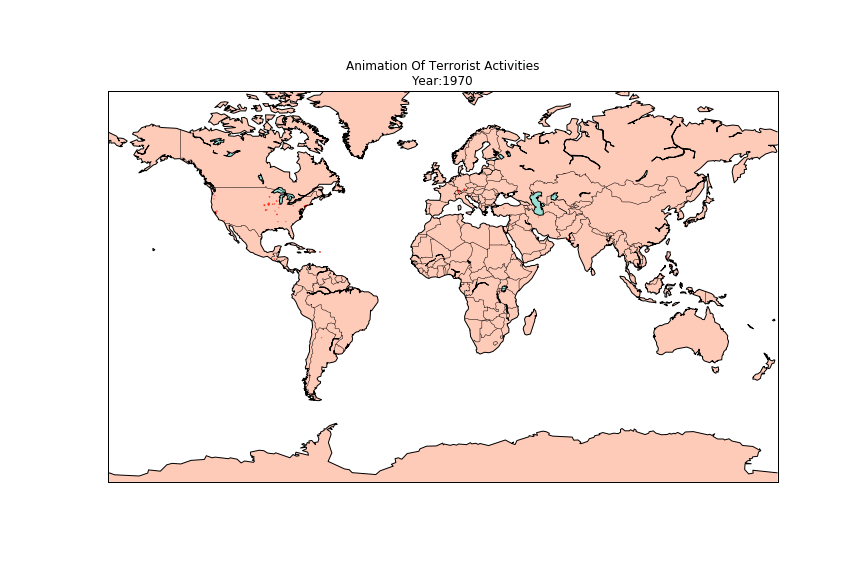

In [81]:
fig = plt.figure(figsize = (12,8))
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Animation Of Terrorist Activities'+'\n'+'Year:' +str(Year))
    m1 = Basemap(projection='mill',llcrnrlat=-80,urcrnrlat=80, llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
    lat=list(df[df['Year']==Year].latitude)
    long=list(df[df['Year']==Year].longitude)
    x1,y1=m1(long,lat)
    m1.scatter(x1, y1,s=[(kill+wound)*0.1 for kill,wound in zip(df[df['Year']==Year].Killed,df[df['Year']==Year].Wounded)],color = 'r')
    m1.drawcoastlines()
    m1.drawcountries()
    m1.fillcontinents(zorder = 1,alpha=0.4,color='coral',lake_color='aqua')
    m1.drawmapboundary()
ani = animation.FuncAnimation(fig,animate,list(df.Year.unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

In [83]:
# delete file
os.remove('globalterrorismdb_0718dist.csv')